# Library load <a class="anchor" id="1"></a>

In [ ]:

import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
import seaborn as sns
import itertools
import holoviews as hv
import plotly.express as px
import kaleido
import scanpy.external as sce

from matplotlib import pylab
import sys
import yaml
import os
from pandas.api.types import CategoricalDtype
import plotly
import random


import matplotlib.pyplot as plt



In [2]:
plotly.offline.init_notebook_mode()


In [3]:
get_ipython().run_line_magic('matplotlib', 'inline')


In [4]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=50, facecolor='white')
pylab.rcParams['figure.figsize'] = (4, 4)



scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


In [5]:

with open(os.path.expanduser('~')+"/paths_config.yaml", 'r') as f:
    paths = yaml.load(f, Loader=yaml.FullLoader)



#indir=paths["paths"]["indir"][hostRoot]
outdir="./outdir"
#projectBaseDir=paths["paths"]["projectBaseDir"][hostRoot]
adataPath = outdir+"/3_polaroid_quickAnno.h5ad"
adataRawPath = outdir+"/1_polaroid_mint.h5ad"
BadhuriPath = outdir+"/NowaCurated.h5ad"
BadhuriRawPath = "./data/Badhuri_atlas.h5ad"

figDir = "./Figures_publication"
#outBaseName = "03.2B_Dimreduct_inDepthCompositions"


# Mapping annotations <a class="anchor" id="2"></a>

In [6]:

leiden3Mapping = {"0":"POL_Encs-1",
"1":"POL_CBC/BRCs-1",
"2":"POL_EXN-1",
"3":"POL_EnCs-2",
"4":"POL_RGCs-1",
"5":"POL_RGCs-2",
"6":"POL_ccRGCs",
"7":"POL_inPCs",
"8":"POL_EXN-2",
"9":"POL_RtCs",
"10":"POL_ER-Cs",
"11":"POL_CBC/BRCs-2"}


badhuriClMapping = {
    'ipc':"BADH_ipc",
     'interneuron':"BADH_interneuron",
     'dividing':"BADH_dividing",
     'opc':"BADH_opc",
     'radial':"BADH_radial",
     'cr':"BADH_cr",
     'excitatory':"BADH_excitatory",
     'endothelial':"BADH_endothelial"
    
}

BadhuriCategoriesOrder = ["BADH_dividing","BADH_radial","BADH_opc","BADH_ipc","BADH_cr","BADH_excitatory","BADH_interneuron","BADH_endothelial"]
PolaroidsCategoriesorder = ["POL_CRGC","POL_RGC1","POL_RGC2","POL_RCs","POL_EXN1","POL_EXN2","POL_InN","POL_ER","POL_CPC1","POL_CPC2","POL_ChP/CBC/BRC-1","POL_ChP/CBC/BRC-2"]


# Adata load <a class="anchor" id="3"></a>

In [7]:
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnnotated"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnnotated_colors"] = adata.uns["leiden0.3_colors"].copy()



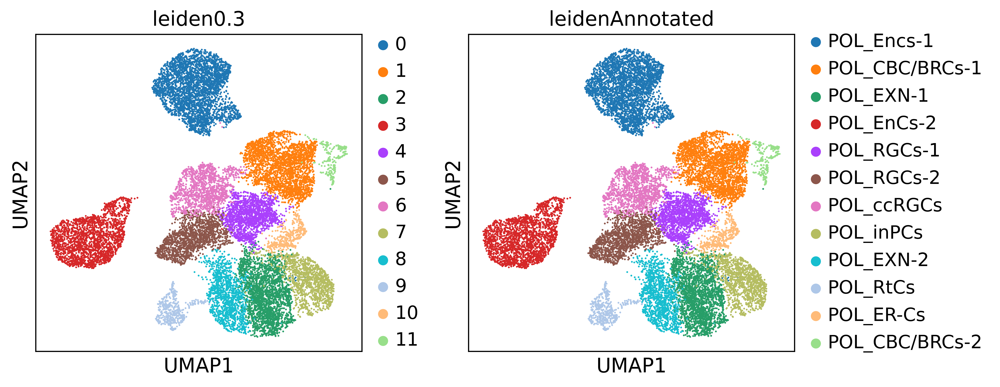

In [8]:
sc.pl.umap(adata, color=["leiden0.3","leidenAnnotated"])

In [9]:

adata.raw.to_adata().X.data

adataRaw = sc.read_h5ad(adataRawPath)

adata.X = adataRaw[adata.obs_names, adata.var_names].X
del adataRaw



# Badhuri load <a class="anchor" id="4"></a>

In [10]:

adataBadhuri_raw = sc.read_h5ad(BadhuriRawPath)
varMap = adataBadhuri_raw.var.copy()
adataBadhuri_raw = adataBadhuri_raw.raw.to_adata()
adataBadhuri_raw.var = adataBadhuri_raw.var.merge(varMap.drop(columns=["feature_biotype"]), left_index=True, right_index=True, how="left").set_index("feature_name")
adataBadhuri_raw.var.index.name = None


adataBadhuri = sc.read_h5ad(BadhuriPath)
adataBadhuri = adataBadhuri.raw.to_adata()


adataBadhuri.X = adataBadhuri_raw[adataBadhuri.obs_names, adataBadhuri.var_names].X
adataBadhuri.obs["cluster_label_aggr"] = adataBadhuri.obs["cluster_label_aggr"].replace(badhuriClMapping)
del adataBadhuri_raw

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:794: UserWarning:


AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.7', 'AP006222.1', 'RP4-669L17.4', 'LINC01409', 'LINC00115']

    Inferred to be: categorical




# Subset for common genes and conatenation <a class="anchor" id="5n"></a>

In [11]:

# Subset for common genes
Commongenes = adataBadhuri.var_names.intersection(adata.var_names)

adataBadhuri_obs_backup = adataBadhuri.obs.copy()
adata_obs_backup = adata.obs.copy()

# Store relevant metadata
adataBadhuri.obs["leidenAnnotated"] = adataBadhuri.obs["cluster_label_aggr"].copy()
#adata.obs["leidenAnnotated"] = adata.obs["leiden0.3"].replace(leiden3Mapping).copy()

adataBadhuri.obs["leidenAnnotated_area"] = adataBadhuri.obs["leidenAnnotated"].astype(str) +"_"+ adataBadhuri.obs["cortical_area"].astype(str)
adata.obs["leidenAnnotated_area"] = adata.obs["leidenAnnotated"].astype(str) +"_"+ adata.obs["region"].astype(str)

adataBadhuri.obs = adataBadhuri.obs[["leidenAnnotated","leidenAnnotated_area"]]
adata.obs = adata.obs[["leidenAnnotated","leidenAnnotated_area"]]

adataBadhuri.obs["dataset"] = "Badhuri"
adata.obs["dataset"] = "Polaroids"

#Keep only relevant cols
adataBadhuri.obs = adataBadhuri.obs[["leidenAnnotated","leidenAnnotated_area","dataset"]]
adata.obs = adata.obs[["leidenAnnotated","leidenAnnotated_area","dataset"]]


CombinedAdata = ad.concat([adataBadhuri[:,Commongenes],adata[:,Commongenes]])

del adataBadhuri

/usr/local/lib/python3.8/dist-packages/anndata/_core/merge.py:895: UserWarning:

Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.



In [12]:

CombinedAdata.layers["mint"] = CombinedAdata.X.copy()

sc.pp.normalize_total(CombinedAdata, target_sum = 20000)
CombinedAdata.layers["libNorm"] = CombinedAdata.X.copy()

sc.pp.log1p(CombinedAdata)
CombinedAdata.layers["libNorm_logNorm"] = CombinedAdata.X.copy()

CombinedAdata_BU = CombinedAdata.copy()


#CombinedAdata_BU.write_h5ad(outdir+"/Correlaton_preBulk.h5ad")


normalizing counts per cell
    finished (0:00:04)


## Aggregation 2: cell types + badhuri regions

### Pseudobulking <a class="anchor" id="6"></a>

In [13]:
PseudooReplicates_per_group = 5
#CombinedAdata_BU = sc.read_h5ad(outdir+"/Correlaton_preBulk.h5ad")


CombinedAdata = CombinedAdata_BU.copy()


CombinedAdata.obs["leidenAnnotated_area_aggregated"] = CombinedAdata.obs["leidenAnnotated_area"].astype("str").replace({"_proximal":"","_medial":"","_distal":"",
                                                 "_piece1":"","_piece2":"","_piece3":""},
                                                 regex=True).astype("category")


groupingCovariate = "leidenAnnotated_area_aggregated"

print("Pbulking with target of "+str(PseudooReplicates_per_group)+" PRs will result in following cells per PR")
CombinedAdata.obs.groupby(groupingCovariate).size() / PseudooReplicates_per_group


Pbulking with target of 5 PRs will result in following cells per PR


leidenAnnotated_area_aggregated
BADH_cr_motor                       18.6
BADH_cr_parietal                     3.2
BADH_cr_pfc                         23.0
BADH_cr_somatosensory                3.2
BADH_cr_temporal                    13.2
BADH_cr_v1                          21.0
BADH_dividing_motor               1598.0
BADH_dividing_parietal            1342.4
BADH_dividing_pfc                  960.0
BADH_dividing_somatosensory       1419.4
BADH_dividing_temporal            1155.6
BADH_dividing_v1                  1433.6
BADH_endothelial_motor              13.8
BADH_endothelial_parietal            3.2
BADH_endothelial_pfc                14.0
BADH_endothelial_somatosensory       9.8
BADH_endothelial_temporal            7.4
BADH_endothelial_v1                  9.8
BADH_excitatory_motor             5371.0
BADH_excitatory_parietal          6073.4
BADH_excitatory_pfc               9463.6
BADH_excitatory_somatosensory     2654.2
BADH_excitatory_temporal          3947.2
BADH_excitatory_v1       

In [14]:



total = pd.DataFrame(index = CombinedAdata.var_names)
total_metadata = pd.DataFrame(index= ["_".join(Rep) for Rep in  list(itertools.product(CombinedAdata.obs[groupingCovariate].unique().tolist(), [str(r)  for r in list(range(PseudooReplicates_per_group))]))])
for group in CombinedAdata.obs[groupingCovariate].unique().tolist():
    groupAdata = CombinedAdata[CombinedAdata.obs[groupingCovariate] == group]
    
    group_cells = groupAdata.obs_names.tolist()
    random.Random(4).shuffle(group_cells)
    
    metaCellslist=[group_cells[i::PseudooReplicates_per_group] for i in range(PseudooReplicates_per_group)]
    
    for partition in enumerate(metaCellslist):
        
        total['{}_{}'.format(group, partition[0])] = CombinedAdata[partition[1]].layers["libNorm"].sum(axis = 0).A1
    
        total_metadata.loc['{}_{}'.format(group, partition[0]),"group"] = group
        total_metadata.loc['{}_{}'.format(group, partition[0]),"pseudoreplicate"] = partition[0]
        total_metadata.loc['{}_{}'.format(group, partition[0]),"number_of_cell"] = int(len(partition[1]))
    
    #With this line we propagate - whenever possible -  obs to aggregated pReplicate
    for obsMD in [obsMD for obsMD in groupAdata.obs.columns.tolist() if len(groupAdata.obs[obsMD].unique()) == 1 and obsMD != groupingCovariate]:
        total_metadata.loc[["_".join(l) for l in list(itertools.product([group],[str(r)  for r in list(range(PseudooReplicates_per_group))]))], obsMD ] = CombinedAdata.obs.loc[CombinedAdata.obs[groupingCovariate] == group,obsMD][0]
total_metadata = total_metadata.dropna(axis = 1)
adata_bulk = sc.AnnData(total.transpose()).copy()
adata_bulk.var = CombinedAdata.var.copy()
adata_bulk.obs = pd.concat([adata_bulk.obs, total_metadata], axis = 1)

sc.pp.normalize_total(adata_bulk, target_sum = 20000)
sc.pp.log1p(adata_bulk)

normalizing counts per cell
    finished (0:00:00)


# Integration:considered HVGs are the only common to both datasets <a class="anchor" id="7"></a>



If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


... storing 'group' as categorical
... storing 'leidenAnnotated' as categorical
... storing 'dataset' as categorical


    finished (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



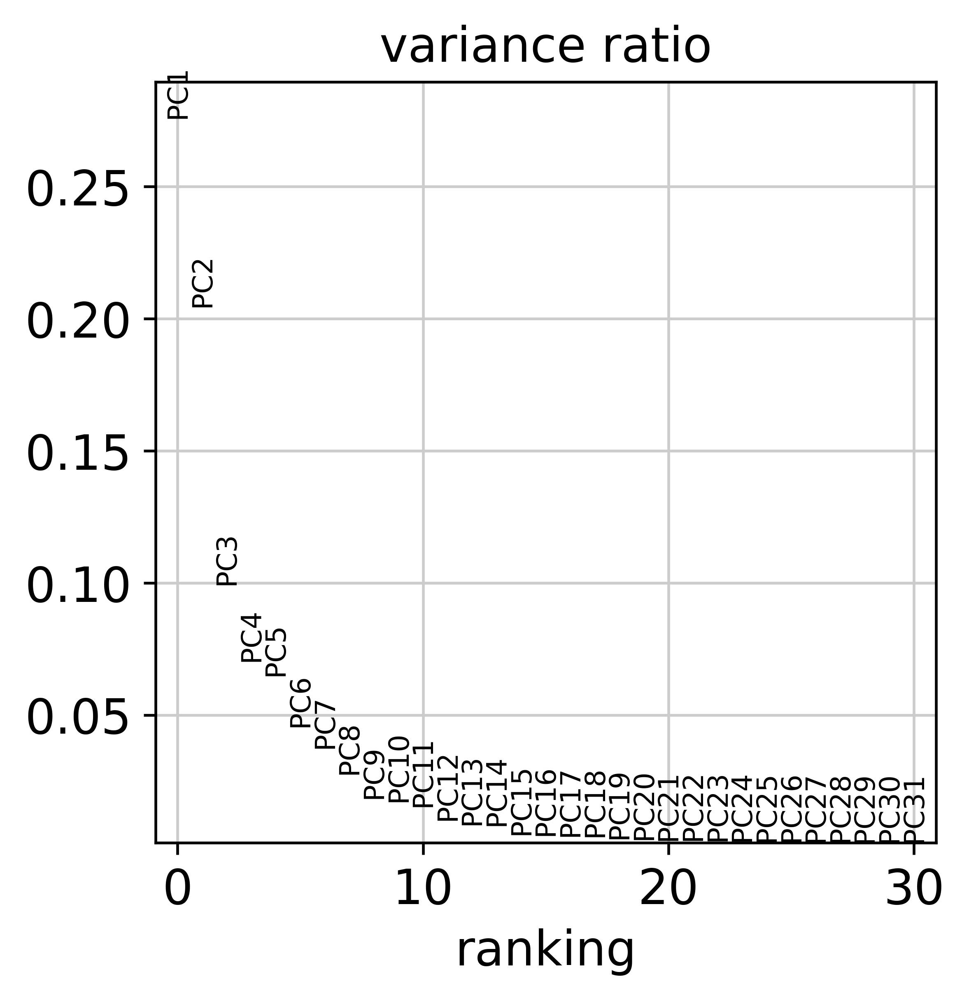

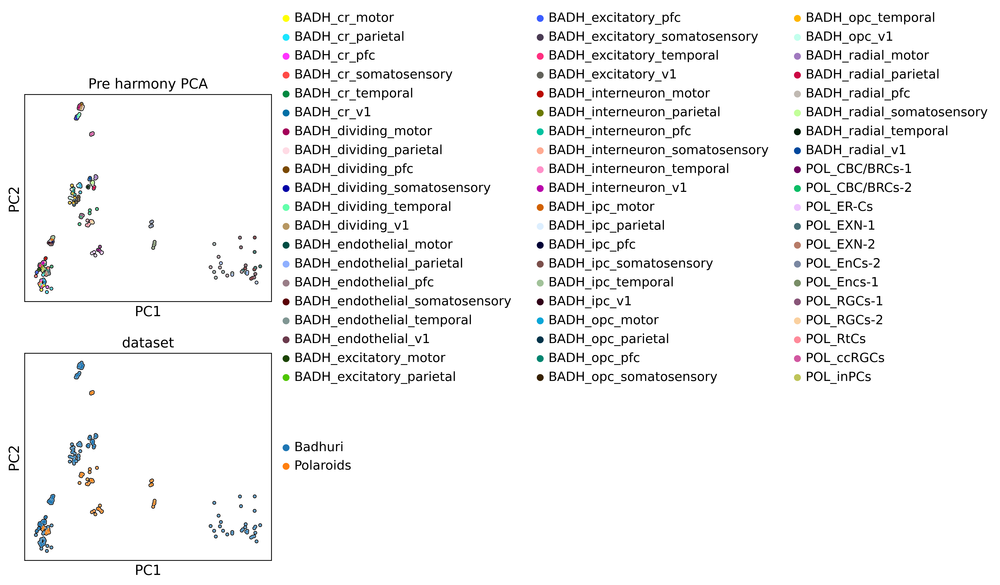

/usr/local/lib/python3.8/dist-packages/scipy/cluster/vq.py:575: UserWarning:

One of the clusters is empty. Re-run kmeans with a different initialization.

2023-03-28 10:29:17,141 - harmonypy - INFO - Iteration 1 of 20
2023-03-28 10:29:17,141 - harmonypy - INFO - Iteration 1 of 20
2023-03-28 10:29:17,347 - harmonypy - INFO - Iteration 2 of 20
2023-03-28 10:29:17,347 - harmonypy - INFO - Iteration 2 of 20
2023-03-28 10:29:17,400 - harmonypy - INFO - Iteration 3 of 20
2023-03-28 10:29:17,400 - harmonypy - INFO - Iteration 3 of 20
2023-03-28 10:29:17,424 - harmonypy - INFO - Iteration 4 of 20
2023-03-28 10:29:17,424 - harmonypy - INFO - Iteration 4 of 20
2023-03-28 10:29:17,459 - harmonypy - INFO - Iteration 5 of 20
2023-03-28 10:29:17,459 - harmonypy - INFO - Iteration 5 of 20
2023-03-28 10:29:17,476 - harmonypy - INFO - Iteration 6 of 20
2023-03-28 10:29:17,476 - harmonypy - INFO - Iteration 6 of 20
2023-03-28 10:29:17,535 - harmonypy - INFO - Iteration 7 of 20
2023-03-28 10:29:17,535 -

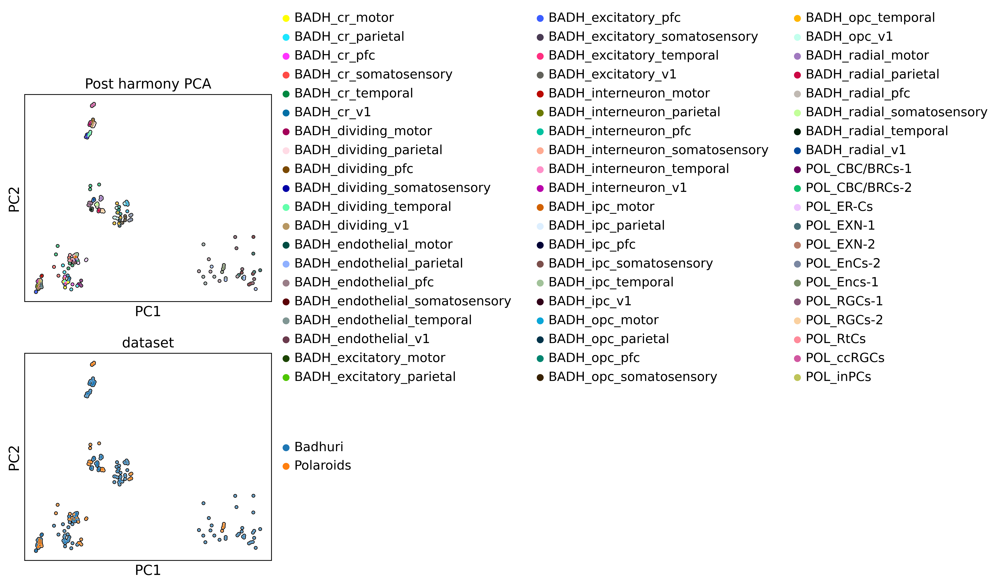

In [15]:
from importlib import reload
import harmony_mod
from harmony_mod import *

reload(harmony_mod)
from harmony_mod import *

npcs=10

adata_bulk_DS = adata_bulk.copy()
#adata_bulk_DS = adata_bulk_DS[adata_bulk_DS.obs.dataset.isin(["Polaroids"])]
HVGs = sc.pp.highly_variable_genes(adata_bulk_DS,n_top_genes=2000,batch_key="dataset", inplace =False)
HVGs = HVGs[HVGs.highly_variable_intersection].index.tolist()

adata_bulk_DS.var["highly_variable"] = False
adata_bulk_DS.var.loc[HVGs,"highly_variable"] = True

adata_bulk_DS = adata_bulk_DS[:,adata_bulk_DS.var["highly_variable"]]



sc.tl.pca(adata_bulk_DS, use_highly_variable=True)
sc.pl.pca_variance_ratio(adata_bulk_DS)

sc.pl.pca(adata_bulk_DS, color = ["group","dataset"], ncols = 1, add_outline=True, size = 20, title="Pre harmony PCA")


#adata_bulk_DS.obsm["X_pca"] = adata_bulk_DS.obsm["X_pca"][:,:npcs]


harmony_integrate_mod(adata_bulk_DS, 'dataset', adjusted_basis ="X_pca", theta = 4, max_iter_harmony = 20)
#sc.pp.neighbors(adata_bulk_DS, n_neighbors=5, n_pcs=10)
sc.pl.pca(adata_bulk_DS, color = ["group","dataset"], ncols = 1, add_outline=True, size = 20, title="Post harmony PCA")

### Correlation 1.1 between cell types <a class="anchor" id="8"></a>



    using 'X_pca' with n_pcs = 10
Storing dendrogram info using `.uns['dendrogram_group']`


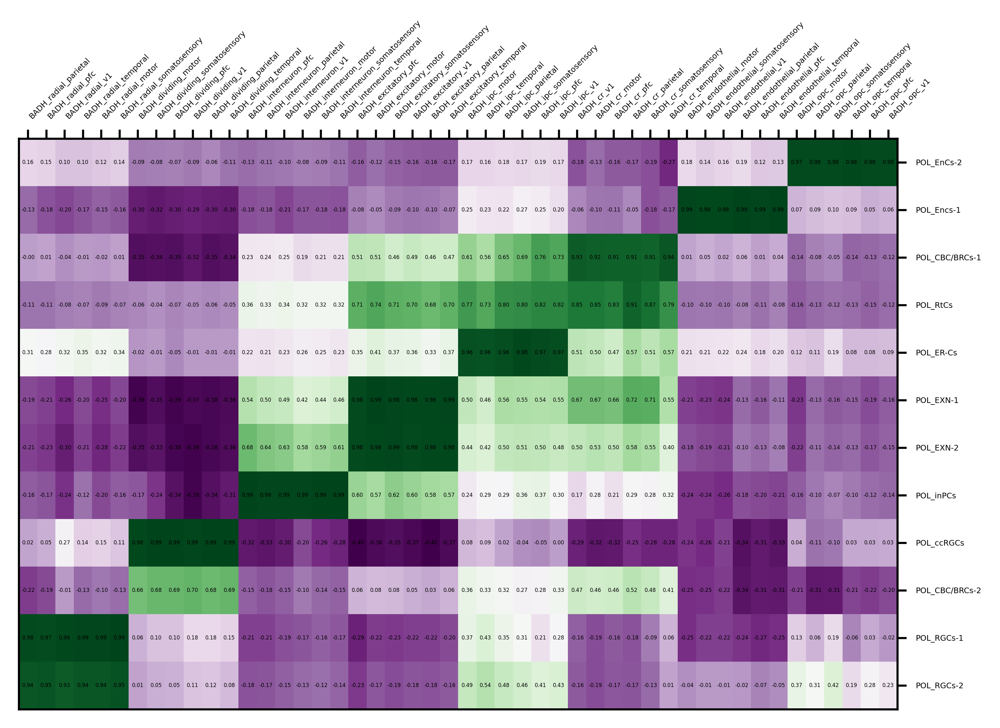

In [16]:
contrastCov = "group"



sc.tl.dendrogram(adata_bulk_DS, contrastCov, n_pcs=npcs)
#sc.pl.correlation_matrix(adata_bulk_DS, contrastCov, figsize=(40,30), show_correlation_numbers=True)

#sc.tl.dendrogram(adata_bulk_DS, 'group')






GroupCat = adata_bulk_DS.obs[contrastCov].cat.categories

BadhuriGroups = adata_bulk_DS.obs.loc[adata_bulk_DS.obs["dataset"] == "Badhuri",contrastCov].unique().tolist()
PolaroidsGroups = adata_bulk_DS.obs.loc[adata_bulk_DS.obs["dataset"] == "Polaroids",contrastCov].unique().tolist()

BadhuriGroupsOrdered = [i for i in adata_bulk_DS.uns["dendrogram_"+contrastCov]["categories_ordered"] if i in BadhuriGroups]

PolaroidsGroupsOrdered = [i for i in adata_bulk_DS.uns["dendrogram_"+contrastCov]["categories_ordered"] if i in PolaroidsGroups]



corrDF = pd.DataFrame(adata_bulk_DS.uns["dendrogram_"+contrastCov]["correlation_matrix"],
             columns=GroupCat,
             index=GroupCat)



corrDFTectangular = corrDF.loc[PolaroidsGroupsOrdered,BadhuriGroupsOrdered]
#plt.matshow(corrDFTectangular, cmap="bwr")



fig, ax = plt.subplots( figsize=(6, 4))
ax.pcolormesh(corrDFTectangular, cmap="PRGn")
ax.set_xlim(0, corrDFTectangular.shape[1])
ax.set_ylim(0, corrDFTectangular.shape[0])

ax.yaxis.tick_right()
ax.set_yticks(np.arange(corrDFTectangular.shape[0]) + 0.5)
ax.set_yticklabels(PolaroidsGroupsOrdered,size = 3)

#ax.xaxis.tick_right()
ax.xaxis.tick_top()
ax.xaxis.set_tick_params(labeltop=True)
ax.xaxis.set_tick_params(labelbottom=False)
ax.set_xticks(np.arange(corrDFTectangular.shape[1]) + 0.5)
ax.set_xticklabels(BadhuriGroupsOrdered, rotation=45, ha='left',size = 3)

#ax.set_xticks(corrDFTectangular.columns)
#ax.set_yticks(corrDFTectangular.index)
#ax.set_yticklabels(BadhuriGroupsOrdered)
#ax.set_xticklabels(PolaroidsGroupsOrdered)
for row, col in itertools.product(corrDFTectangular.index.tolist(),
                                  corrDFTectangular.columns.tolist()):
    ax.text(
        corrDFTectangular.columns.get_loc(col) + 0.5,
        corrDFTectangular.index.get_loc(row) + 0.5,
        f"{corrDFTectangular.loc[row, col]:.2f}",
        ha='center',
        va='center',
        size=2
    )


fig.savefig(figDir+"/correlation_region.pdf", bbox_inches='tight')
corrDFTectangular.to_csv(outdir+"/Correlations/Corr_PCA_region.tsv",sep="\t")

